# Scene Classification using VGG

Steps:
1. Importing (or installing) Tensorflow, Keras and other packages on your system
2. Defining your tensorflow CNN model architecture
3. Loading your data from disk
4. Creating your training and testing splits
5. Data Preprocessing (Augumentation)
6. Compiling your tensorflow CNN model
7. Training your model on your training data
8. Saving The train model
9. Generate Plots for accuracy and validation loss
10. Making predictions using your trained tensorflow model

##### Select GPU Runtime, Install Tensorflow 2.0.0 and restart the runtime

In [ ]:
!pip install tensorflow-gpu==2.0.0

     |████████████████████████████████| 380.8 MB 42 kB/s 
     |████████████████████████████████| 3.8 MB 30.1 MB/s 
     |████████████████████████████████| 50 kB 5.8 MB/s 
     |████████████████████████████████| 449 kB 44.1 MB/s 
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7554 sha256=2bbcbcc4aeefba67e0b457a558e57f94677a43c2f5e38f9fcb8b55cdbefeda2f
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Succes

## connect Drive folder to colab and set working dir

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os 
os.chdir("/content/drive/MyDrive/DeepL/3. Transfer Learning Using VGG")

In [ ]:
!dir

acc_output.png				      test_examples.rar
loss_output.png				      vgg16\ fine\ tune.png
Scene\ Classification\ using\ VGG\ (1).ipynb  vgg16.png
Scene\ Classification\ using\ VGG.ipynb       vgg_dataset.rar


### Step 1: Importing all the packages

In [ ]:
# import the necessary packages
from tensorflow.keras.models import Sequential
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD

from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import random
import cv2
import os

import warnings
from tqdm import tqdm_notebook as tqdm
import itertools
import tensorflow as tf 

print("Tensorlfow Version: ", tf.__version__)
warnings.filterwarnings("ignore")
SEED = 42   # set random seed

Tensorlfow Version:  2.0.0


In [ ]:
!pip install patool

     |████████████████████████████████| 77 kB 3.2 MB/s 


In [ ]:
import patoolib
patoolib.extract_archive("vgg_dataset.rar")
patoolib.extract_archive("test_examples.rar")

patool: Extracting vgg_dataset.rar ...
patool: running /usr/bin/unrar x -- "/content/drive/MyDrive/DeepL/3. Transfer Learning Using VGG/vgg_dataset.rar"
patool:     with cwd='./Unpack_ro3bk8df'
patool: ... vgg_dataset.rar extracted to `vgg_dataset'.
patool: Extracting test_examples.rar ...
patool: running /usr/bin/unrar x -- "/content/drive/MyDrive/DeepL/3. Transfer Learning Using VGG/test_examples.rar"
patool:     with cwd='./Unpack_o2pd0alq'
patool: ... test_examples.rar extracted to `test_examples'.


'test_examples'

In [ ]:
## config
CLASSES = ["buildings", "forest", "sea"]

DATASET = "vgg_dataset"  # this folde must contain three subfolder with images
MODEL = "vgg_16_scene.model" # name to store the model on disk
PLOT = "vgg_plot.png" # plot name

# set the batch size when fine-tuning
BATCH_SIZE = 32

EPOCHS = 50
INIT_LR = 1e-3

LE_PATH = os.path.sep.join(["output", "le.cpickle"])
BASE_CSV_PATH = "output"

# set the path to the serialized model after training
MODEL_PATH = os.path.sep.join(["output", "scene.model"])

# define the path to the output training history plots
UNFROZEN_PLOT_PATH = os.path.sep.join(["output", "unfrozen.png"])
WARMUP_PLOT_PATH = os.path.sep.join(["output", "warmup.png"])

In [ ]:
trainPath = r"vgg_dataset/train"
testPath =  r"vgg_dataset/test"

In [ ]:
# determine the total number of image paths in training, validation,
# and testing directories
totalTrain = len(list(paths.list_images(trainPath)))
totalTest = len(list(paths.list_images(testPath)))
print(totalTrain)
print(totalTest)

1217
559


In [ ]:
# initialize the training data augmentation object
trainAug = ImageDataGenerator(
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest")

# initialize the validation/testing data augmentation object (which
# we'll be adding mean subtraction to)
valAug = ImageDataGenerator()

# define the ImageNet mean subtraction (in RGB order) and set the
# the mean subtraction value for each of the data augmentation
# objects
mean = np.array([123.68, 116.779, 103.939], dtype="float32")
trainAug.mean = mean
valAug.mean = mean

In [ ]:
# initialize the training generator
trainGen = trainAug.flow_from_directory(
    trainPath,
    class_mode="categorical",
    target_size=(224, 224),
    color_mode="rgb",
    shuffle=True,
    batch_size=BATCH_SIZE)


# initialize the testing generator
testGen = valAug.flow_from_directory(
    testPath,
    class_mode="categorical",
    target_size=(224, 224),
    color_mode="rgb",
    shuffle=False,
    batch_size=BATCH_SIZE)

Found 1217 images belonging to 3 classes.
Found 559 images belonging to 3 classes.


In [ ]:
# load the VGG16 network, ensuring the head FC layer sets are left
# off
baseModel = VGG16(weights="imagenet", include_top=False,
                  input_tensor=Input(shape=(224, 224, 3)))

# construct the head of the model that will be placed on top of the
# the base model
headModel = baseModel.output
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(len(CLASSES), activation="softmax")(headModel)

# place the head FC model on top of the base model (this will become
# the actual model we will train)
vgg_model = Model(inputs=baseModel.input, outputs=headModel)

58892288/58889256 [==============================] - 1s 0us/step


In [ ]:
# loop over all layers in the base model and freeze them so they will
# *not* be updated during the first training process
for layer in baseModel.layers:
    layer.trainable = False

In [ ]:
# compile our model (this needs to be done after our setting our
# layers to being non-trainable
print("[INFO] compiling model...")
opt = SGD(lr=1e-4, momentum=0.9)
vgg_model.compile(loss="categorical_crossentropy", optimizer=opt,
              metrics=["accuracy"])

[INFO] compiling model...


In [ ]:
vgg_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
baseModel.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
# train the head of the network for a few epochs (all other layers
# are frozen) -- this will allow the new FC layers to start to become
# initialized with actual "learned" values versus pure random
print("[INFO] training head...")
H = vgg_model.fit(
    x=trainGen,
    steps_per_epoch=totalTrain // BATCH_SIZE,
    validation_data=testGen,
    validation_steps=totalTest // BATCH_SIZE,
    epochs=EPOCHS)

[INFO] training head...
Train for 38 steps, validate for 17 steps
Epoch 1/50
38/38 [==============================] - 45s 1s/step - loss: 3.4445 - accuracy: 0.8270 - val_loss: 0.3243 - val_accuracy: 0.9835
Epoch 2/50
38/38 [==============================] - 35s 926ms/step - loss: 0.9521 - accuracy: 0.9485 - val_loss: 0.2770 - val_accuracy: 0.9853
Epoch 3/50
38/38 [==============================] - 35s 918ms/step - loss: 0.4997 - accuracy: 0.9527 - val_loss: 0.2334 - val_accuracy: 0.9890
Epoch 4/50
38/38 [==============================] - 35s 914ms/step - loss: 0.4426 - accuracy: 0.9662 - val_loss: 0.3468 - val_accuracy: 0.9798
Epoch 5/50
38/38 [==============================] - 35s 917ms/step - loss: 0.4312 - accuracy: 0.9620 - val_loss: 0.2631 - val_accuracy: 0.9890
Epoch 6/50
38/38 [==============================] - 35s 915ms/step - loss: 0.4024 - accuracy: 0.9629 - val_loss: 0.2403 - val_accuracy: 0.9890
Epoch 7/50
38/38 [==============================] - 35s 911ms/step - loss: 0.24

In [ ]:
# reset the testing generator and evaluate the network after
# fine-tuning just the network head
print("[INFO] evaluating after fine-tuning network head...")
testGen.reset()
predIdxs = vgg_model.predict(x=testGen,
    steps=(totalTest // BATCH_SIZE) + 1)
predIdxs = np.argmax(predIdxs, axis=1)

[INFO] evaluating after fine-tuning network head...


In [ ]:
def plot_acc(H, N, plotPath=None):
    # construct a plot that plots and saves the training history
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower left")
    plt.savefig("acc_output.png")

def plot_loss(H, N, plotPath=None):
    # construct a plot that plots and saves the training history
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
   
    plt.title("Training Loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend(loc="lower left")
    plt.savefig("loss_output.png")

In [ ]:
print(classification_report(testGen.classes, predIdxs,
    target_names=testGen.class_indices.keys()))


              precision    recall  f1-score   support

   buildings       0.99      0.99      0.99       190
      forest       0.97      0.99      0.98       182
         sea       0.99      0.96      0.98       187

    accuracy                           0.98       559
   macro avg       0.98      0.98      0.98       559
weighted avg       0.98      0.98      0.98       559



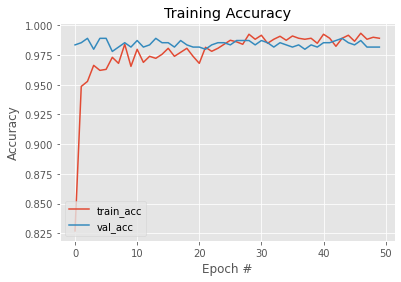

In [ ]:
# plot training and val accuracy
plot_acc(H, EPOCHS)

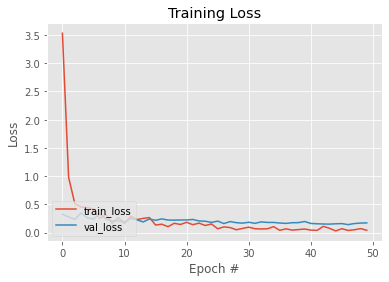

In [ ]:
# plot training and val loss
plot_loss(H, EPOCHS)

In [ ]:
# serialize the# serialize the model to disk

print("[INFO] serializing network...")
vgg_model.save("vgg_model_50epochs2.model", save_format="h5")

[INFO] serializing network...




## Inference on Unseen Data

In [ ]:
import imutils
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import numpy as np
import argparse
import imutils
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

[INFO] loading network and...


  0%|          | 0/28 [00:00<?, ?it/s]

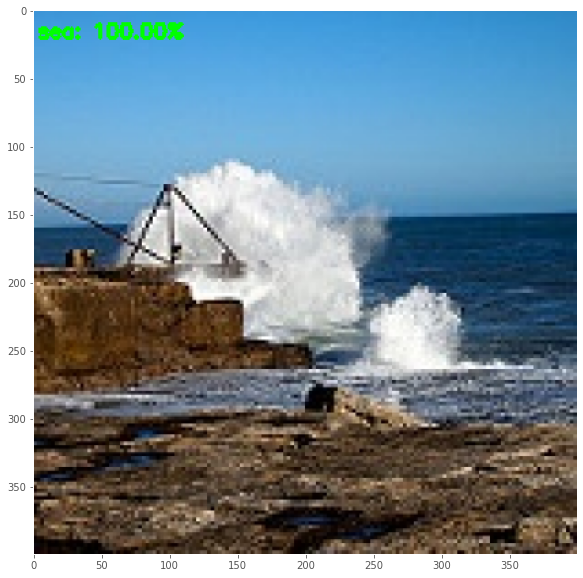

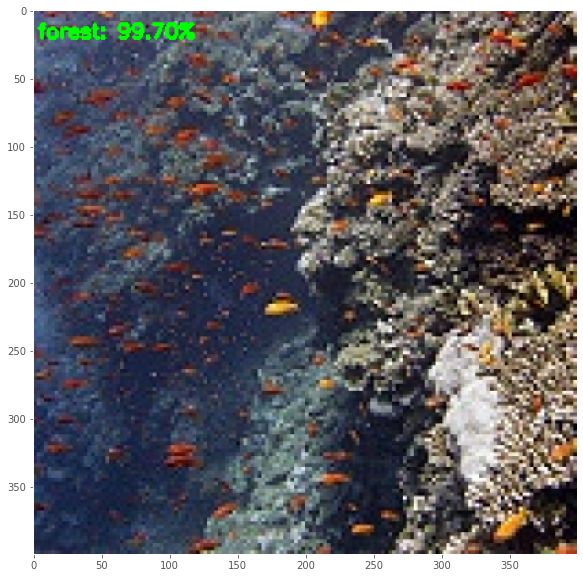

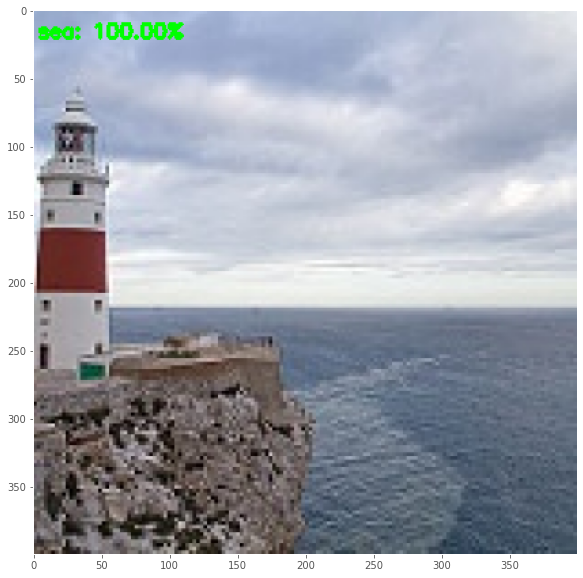

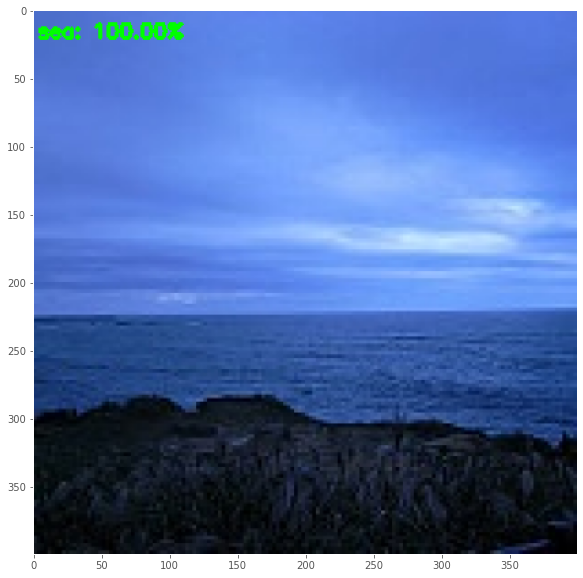

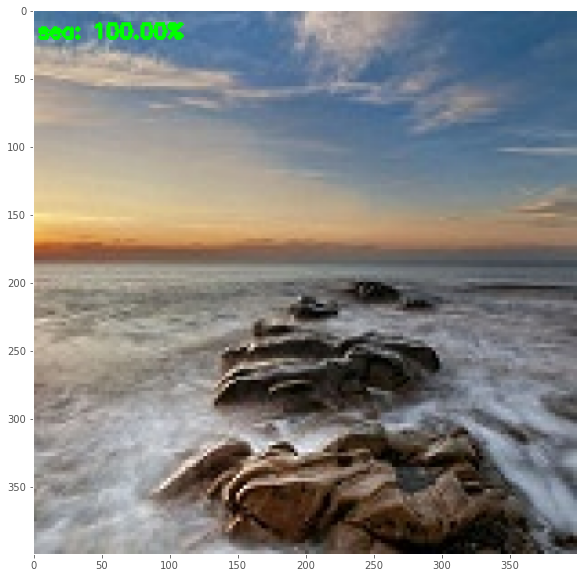

...

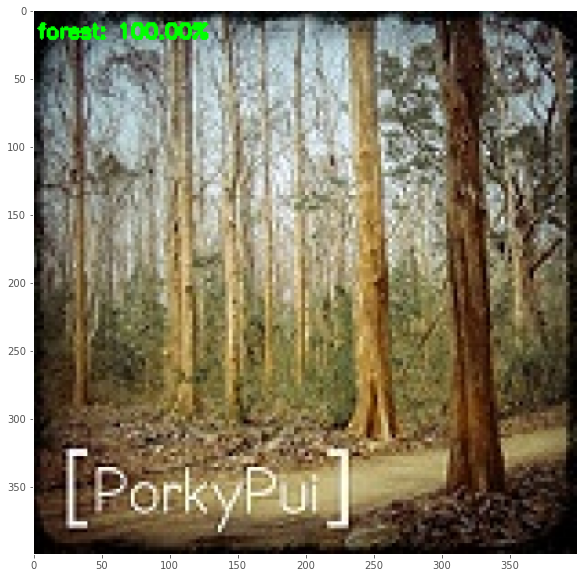

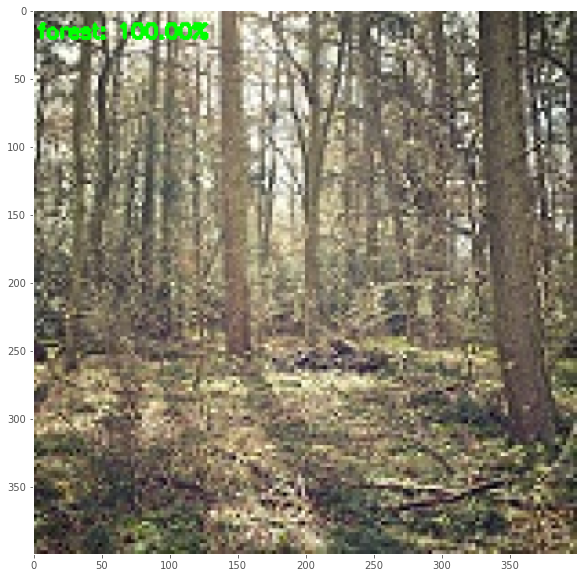

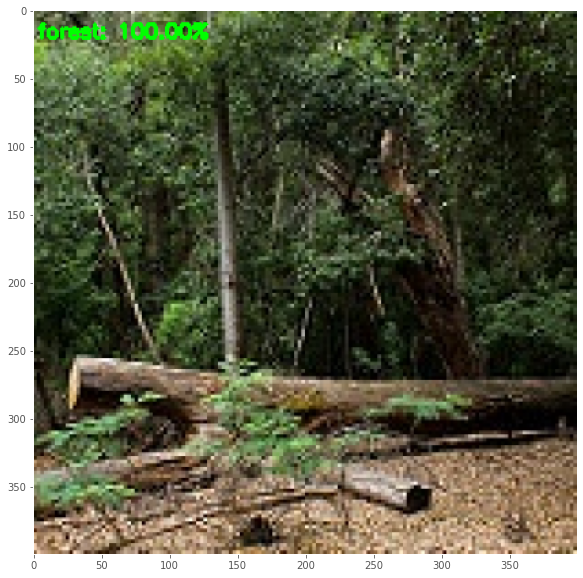

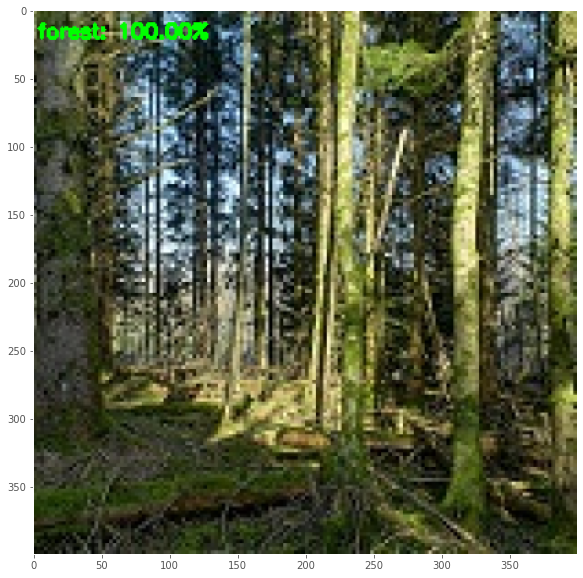

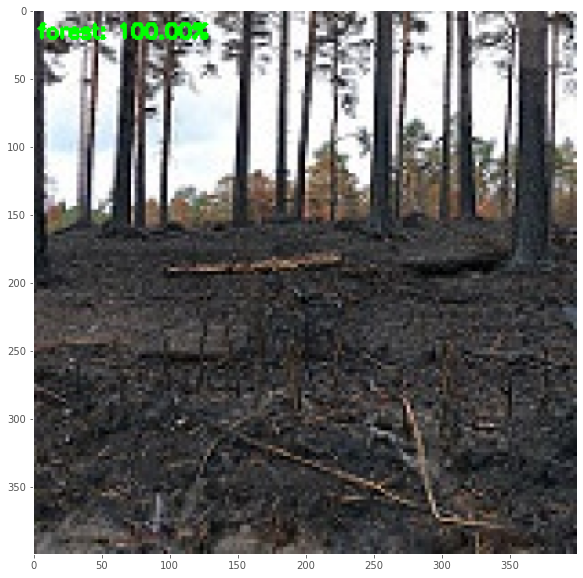

In [27]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2

# # load the model 
print("[INFO] loading network and...")
# model = load_model(MODEL)

# grab the image paths and randomly shuffle themt
testImagePaths = sorted(list(paths.list_images('test_examples')))   # data folder with 2 categorical folders


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        
        image = cv2.imread(imagePath)
        output = image.copy()
        output = imutils.resize(output, width=400)

        # our model was trained on RGB ordered images but OpenCV represents
        # images in BGR order, so swap the channels, and then resize to
        # 224x224 (the input dimensions for VGG16)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (224, 224))

        # convert the image to a floating point data type and perform mean
        # subtraction
        image = image.astype("float32")
        mean = np.array([123.68, 116.779, 103.939][::-1], dtype="float32")
        image -= mean
        


        model = vgg_model

        # pass the image through the network to obtain our predictions
        preds = model.predict(np.expand_dims(image, axis=0))[0]
        i = np.argmax(preds)
        label = CLASSES[i]

        # draw the prediction on the output image
        text = "{}: {:.2f}%".format(label, preds[i] * 100)
        cv2.putText(output, text, (3, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
            (0, 255, 0), 2)
        
         # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)

        pbar.update(1)


## Deployment 

In [28]:
# build gradio app
!pip install gradio 

     |████████████████████████████████| 5.2 MB 5.5 MB/s 
     |████████████████████████████████| 84 kB 2.5 MB/s 
     |████████████████████████████████| 253 kB 44.8 MB/s 
     |████████████████████████████████| 54 kB 2.1 MB/s 
     |████████████████████████████████| 1.1 MB 36.5 MB/s 
     |████████████████████████████████| 53 kB 2.0 MB/s 
     |████████████████████████████████| 212 kB 37.5 MB/s 
     |████████████████████████████████| 2.0 MB 32.6 MB/s 
     |████████████████████████████████| 144 kB 47.4 MB/s 
     |████████████████████████████████| 94 kB 3.0 MB/s 
     |████████████████████████████████| 271 kB 45.4 MB/s 
     |████████████████████████████████| 10.9 MB 32.5 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
     |████████████████████████████████| 80 kB 7.9 MB/s 
     |████████████████████████████████| 43 kB 947 kB/s 
     |████████████████████████████████| 4.0 MB 17.5 MB/s 
     |████████████████████████████████| 856 kB 27.7 MB/s 
     |██████████████████████

In [29]:
import gradio as gr


def predict_image(image):


    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))

    # convert the image to a floating point data type and perform mean
    # subtraction
    image = image.astype("float32")
    mean = np.array([123.68, 116.779, 103.939][::-1], dtype="float32")
    image -= mean

    # pass the image through the network to obtain our predictions
    preds = model.predict(np.expand_dims(image, axis=0))[0]
    
    result = dict()
    result["Buildings"] = round(float(list(preds)[0]), 3)
    result["Forest"] = round(float(list(preds)[1]), 3)
    result["Sea"] = round(float(list(preds)[2]), 3)
    
    print(result)
    
    return result

In [30]:
im = gr.inputs.Image(shape=(224,224))
label = gr.outputs.Label(num_top_classes=3)
gr.Interface(fn = predict_image, inputs=im, outputs=label, capture_session=True, title="VGG Demo").launch(share=True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://29009.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<gradio.routes.App at 0x7f079d5717d0>,
 'http://127.0.0.1:7860/',
 'https://29009.gradio.app')